# Project

In this project, our aim is to building a model for predicting wine qualities. Our label will be `quality` column. **Do not forget, this is a Classification problem!**

## Steps
- Read the `winequality.csv` file and describe it.
- Make at least 4 different analysis on Exploratory Data Analysis section.
- Pre-process the dataset to get ready for ML application. (Check missing data and handle them, can we need to do scaling or feature extraction etc.)
- Define appropriate evaluation metric for our case (classification).
- Train and evaluate Decision Trees and at least 2 different appropriate algorithm which you can choose from scikit-learn library.
- Check if is there any overfitting and underfitting. Interpret your results and try to overcome if there is any problem in a new section.
- Create confusion metrics for each algorithm and display Accuracy, Recall, Precision and F1-Score values.
- Analyse and compare results of 3 algorithms.
- Select best performing model based on evaluation metric you chose on test dataset.


Good luck :)

<h2>NURIA ANDREA MALET QUINTAR</h2>

# Data

In [77]:
import numpy as np
import pandas as pd
from scipy import stats
import pkg_resources
#pkg_resources.require("Seaborn==0.11.1")
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV 
from sklearn.preprocessing import RobustScaler
from sklearn.svm import LinearSVC as svc
from sklearn.tree import DecisionTreeClassifier as dtr
from sklearn.naive_bayes import GaussianNB as gau
from sklearn.neighbors import KNeighborsClassifier as knc
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, confusion_matrix
from sklearn.ensemble import VotingClassifier, StackingClassifier, RandomForestClassifier


In [2]:
# Describe our data for each feature and use .info() for get information about our dataset
# Analyse missing values

In [3]:
data = pd.read_csv('winequality.csv')
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


# Exploratory Data Analysis

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [5]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [6]:
data.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [7]:
data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

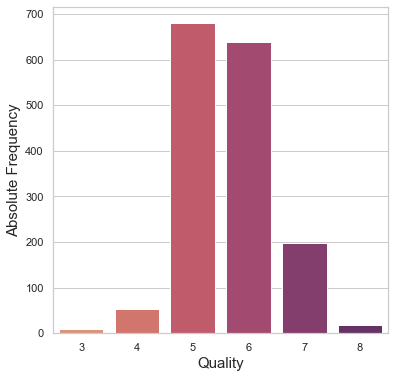

In [8]:
# Wine Quality distribution
plt.rcParams['figure.figsize'] = [6, 6]
sns.set_theme(style='darkgrid', palette='flare')
ax = sns.countplot(x="quality", data=data)
ax.set_xlabel('Quality',fontsize = 15)
ax.set_ylabel('Absolute Frequency',fontsize = 15)
plt.show()


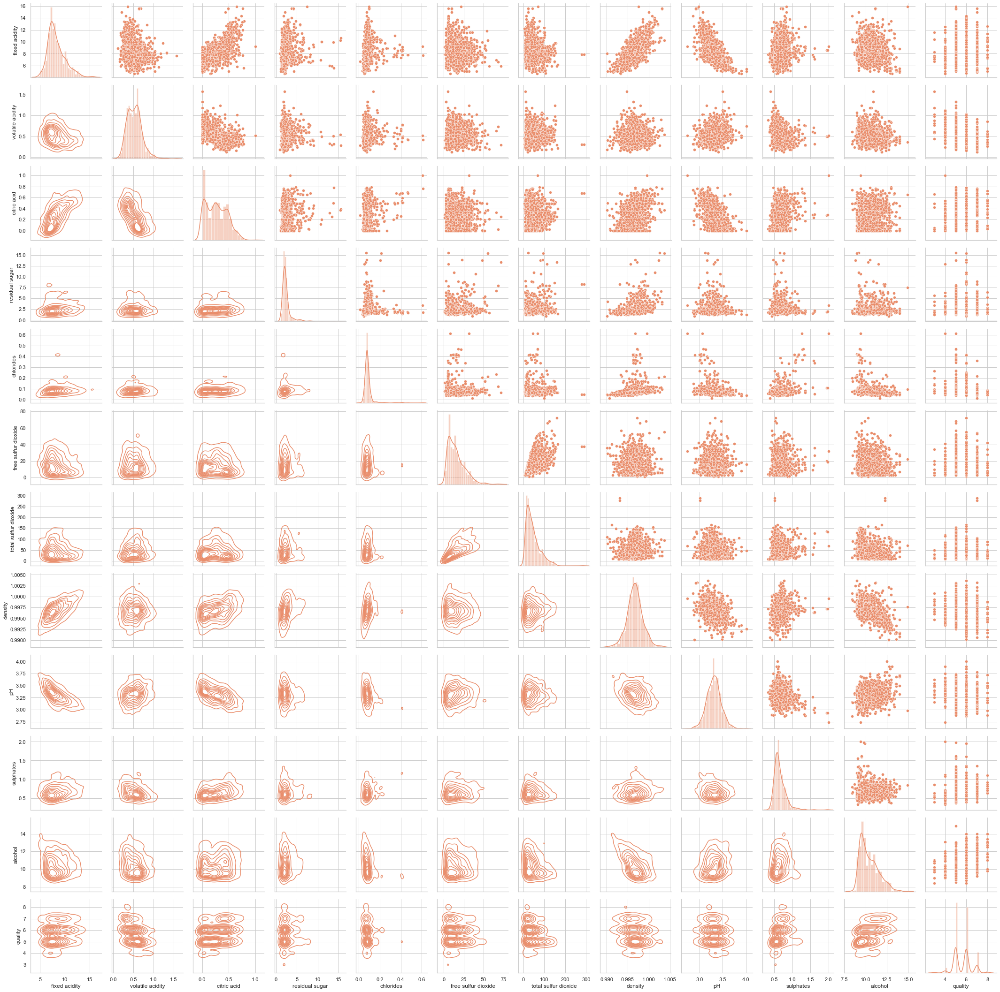

In [9]:
# VISUALIZE DATASET
plt.rcParams['figure.figsize'] = [12, 12]
sns.set_theme(style='darkgrid', palette='flare')
g = sns.PairGrid(data, diag_sharey=False)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.distplot)

# Preprocessing

- Are there any duplicated values?
- Do we need to do feature scaling?
- Do we need to generate new features?
- Split Train and Test dataset. (0.7/0.3)

In [10]:
# Duplicate values
duplicates = data.duplicated(subset=None, keep='first')
print(duplicates.sum())

240


There are duplicate values, I will remove them next.

In [11]:
clean_data = data[~duplicates]
print(clean_data.head(6))
print(len(clean_data))

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
5            7.4              0.66         0.00             1.8      0.075   
6            7.9              0.60         0.06             1.6      0.069   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
5                 13.0                  40.0   0.9978  3.51       0.56   
6        

In [12]:
# Outliers
z = np.abs(stats.zscore(clean_data,axis=1))
outliers = list(set(np.where(z > 3)[0]))
len(outliers)

542

According to this result, more than 40% of the dataset are outliers. It seems that the dataset has atypical values that are legitimate. Therefore, I will not remove any data, but I will pick algorithms keeping this fact in mind.

In [16]:
# Scaling features
col_ranges = clean_data.max() - clean_data.min()
print(col_ranges)

fixed acidity            11.30000
volatile acidity          1.46000
citric acid               1.00000
residual sugar           14.60000
chlorides                 0.59900
free sulfur dioxide      71.00000
total sulfur dioxide    283.00000
density                   0.01362
pH                        1.27000
sulphates                 1.67000
alcohol                   6.50000
quality                   5.00000
dtype: float64


The table above suggest the need for normalization, which will be done next. Given the existence of extrem values in the dataset, I will use an algorithm robust to outliers.

In [13]:
# First separate features from labels to scale only the features
features = clean_data.iloc[:,0:-1]
labels = clean_data.iloc[:,-1:]
print(features.shape)
print(labels.shape)

(1359, 11)
(1359, 1)


In [14]:
# Scale with RobustScaler
scaler = RobustScaler()
scaler.fit(features)
colnames = list(features)
scaled_features = pd.DataFrame(scaler.transform(features),columns=colnames)
col_ranges = scaled_features.max() - scaled_features.min()
print(col_ranges) 


fixed acidity            5.380952
volatile acidity         5.840000
citric acid              2.941176
residual sugar          20.857143
chlorides               28.523810
free sulfur dioxide      5.071429
total sulfur dioxide     6.902439
density                  6.135135
pH                       6.684211
sulphates                9.277778
alcohol                  4.062500
dtype: float64




I do not have enough domain knowledge to suggest new features for this problem. My inspection of the dataset does not suggest the need for it.


In [15]:
# Split dataset
x_train,x_test,y_train,y_test = train_test_split(features,labels,random_state=0,stratify=labels,shuffle=True,test_size=0.3)
print('Training features shape: ', x_train.shape, '\tTraining labels shape: ', y_train.shape)
print('Test features shape: ', x_test.shape, '\tTest labels shape: ', y_test.shape)

Training features shape:  (951, 11) 	Training labels shape:  (951, 1)
Test features shape:  (408, 11) 	Test labels shape:  (408, 1)


# ML Application

- Define models.
- Fit models.
- Evaluate models for both train and test dataset.
- Generate Confusion Matrix and scores of Accuracy, Recall, Precision and F1-Score.
- Analyse occurrence of overfitting and underfitting. If there is any of them, try to overcome it within a different section.

In [56]:
label = data.quality.unique().tolist()

## Decision Trees
sklearn.tree.DecisionTreeClassifier

Accuracy of train: 0.6256572029442692
Test metrics:
Accuracy = 0.5955882352941176
Precision = 0.28917836154486287
Recall = 0.3064940939934657
F1 Score = 0.29673812932077187


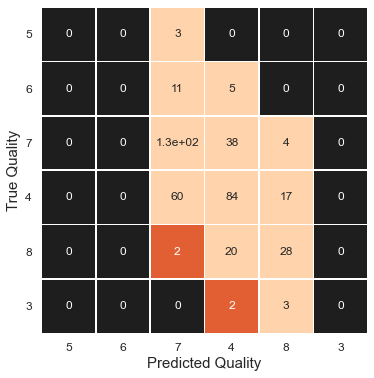

In [61]:
clf_tree = dtr(max_depth=4, random_state=0)
clf_tree.fit(x_train,y_train)
pred = clf_tree.predict(x_test)

# metrics
print("Accuracy of train:",clf_tree.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

## confusion matrix
cm = confusion_matrix(y_test, pred)
plt.figure(figsize=(6, 6))
ax = sns.heatmap(cm, vmax=3, center=0, linewidths=.5,square=True, annot = True, cbar=False)
ax.xaxis.set_ticklabels(label, fontsize = 12)
ax.yaxis.set_ticklabels(label, fontsize = 12, rotation=0)
ax.set_xlabel('Predicted Quality',fontsize = 15)
ax.set_ylabel('True Quality',fontsize = 15)
plt.show()

## K-Neighbors
sklearn.neighbors.KNeighborsClassifier

Accuracy of train: 1.0
Test metrics:
Accuracy = 0.47794117647058826
Precision = 0.2148825232353375
Recall = 0.21917244102969158
F1 Score = 0.21548993855784335


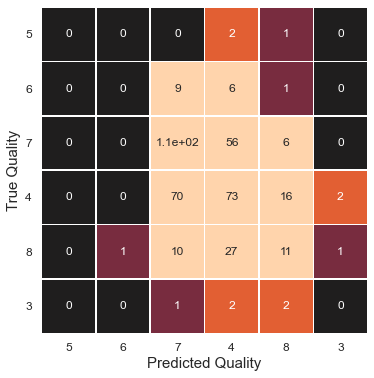

In [63]:
clf_kn = knc(weights='distance')
clf_kn.fit(x_train,y_train)
pred = clf_kn.predict(x_test)

# metrics
print("Accuracy of train:",clf_kn.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

## confusion matrix
cm = confusion_matrix(y_test, pred)
plt.figure(figsize=(6, 6))
ax = sns.heatmap(cm, vmax=3, center=0, linewidths=.5,square=True, annot = True, cbar=False)
ax.xaxis.set_ticklabels(label, fontsize = 12)
ax.yaxis.set_ticklabels(label, fontsize = 12, rotation=0)
ax.set_xlabel('Predicted Quality',fontsize = 15)
ax.set_ylabel('True Quality',fontsize = 15)
plt.show()

## Support Vector Machine
sklearn.svm.LinearSVC (setting multi_class=”crammer_singer”)

Accuracy of train: 0.5289169295478444
Test metrics:
Accuracy = 0.5171568627450981
Precision = 0.23230207032875572
Recall = 0.24835649062339185
F1 Score = 0.21279943002285737


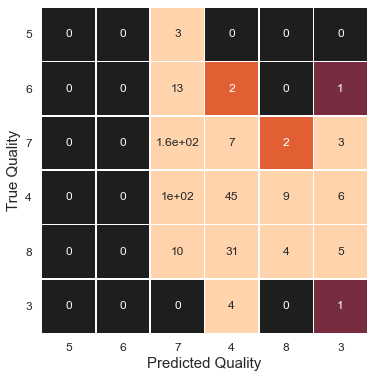

In [64]:
clf_svm = svc(multi_class='crammer_singer', random_state=0)
clf_svm.fit(x_train,y_train)
pred = clf_svm.predict(x_test)

# metrics
print("Accuracy of train:",clf_svm.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

## confusion matrix
cm = confusion_matrix(y_test, pred)
plt.figure(figsize=(6, 6))
ax = sns.heatmap(cm, vmax=3, center=0, linewidths=.5,square=True, annot = True, cbar=False)
ax.xaxis.set_ticklabels(label, fontsize = 12)
ax.yaxis.set_ticklabels(label, fontsize = 12, rotation=0)
ax.set_xlabel('Predicted Quality',fontsize = 15)
ax.set_ylabel('True Quality',fontsize = 15)
plt.show()

## Naïve Bayes
sklearn.naive_bayes.GaussianNB

Accuracy of train: 0.5278654048370137
Test metrics:
Accuracy = 0.5441176470588235
Precision = 0.29517670812395336
Recall = 0.31040482373731937
F1 Score = 0.286790015262456


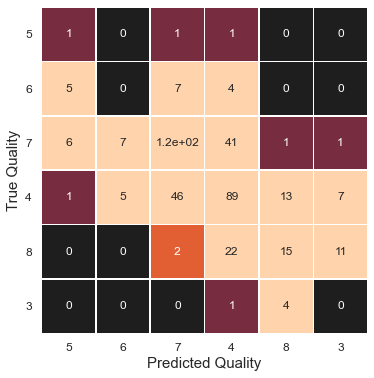

In [65]:
clf_nb = gau()
clf_nb.fit(x_train,y_train)
pred = clf_nb.predict(x_test)

# metrics
print("Accuracy of train:",clf_nb.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

## confusion matrix
cm = confusion_matrix(y_test, pred)
plt.figure(figsize=(6, 6))
ax = sns.heatmap(cm, vmax=3, center=0, linewidths=.5,square=True, annot = True, cbar=False)
ax.xaxis.set_ticklabels(label, fontsize = 12)
ax.yaxis.set_ticklabels(label, fontsize = 12, rotation=0)
ax.set_xlabel('Predicted Quality',fontsize = 15)
ax.set_ylabel('True Quality',fontsize = 15)
plt.show()

## Random Forest
sklearn.ensemble.RandomForestClassifier

Accuracy of train: 0.6445846477392219
Test metrics:
Accuracy = 0.6151960784313726
Precision = 0.3326308714070494
Recall = 0.2659403535226606
F1 Score = 0.2605896395558413


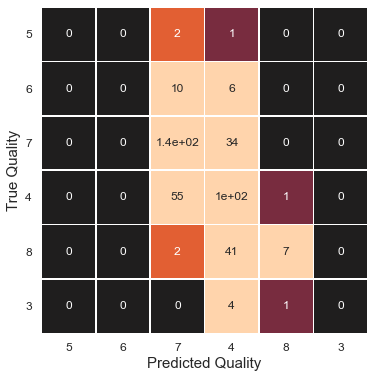

In [78]:
clf_rf = RandomForestClassifier(n_estimators=50,max_depth=4, random_state=0)
clf_rf.fit(x_train,y_train)
pred = clf_rf.predict(x_test)

# metrics
print("Accuracy of train:",clf_rf.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

## confusion matrix
cm = confusion_matrix(y_test, pred)
plt.figure(figsize=(6, 6))
ax = sns.heatmap(cm, vmax=3, center=0, linewidths=.5,square=True, annot = True, cbar=False)
ax.xaxis.set_ticklabels(label, fontsize = 12)
ax.yaxis.set_ticklabels(label, fontsize = 12, rotation=0)
ax.set_xlabel('Predicted Quality',fontsize = 15)
ax.set_ylabel('True Quality',fontsize = 15)
plt.show()

## Voting Ensamble
sklearn.ensemble.VotingClassifier

In [79]:
vote_hard = VotingClassifier(estimators=[('dt', clf_tree), ('kn', clf_kn), ('nb', clf_nb), ('sv', clf_svm), ('rf', clf_rf)], voting='hard')
vote_hard = vote_hard.fit(x_train, y_train)
pred = vote_hard.predict(x_test)

# metrics
print("Accuracy of train:",vote_hard.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

Accuracy of train: 0.6803364879074658
Test metrics:
Accuracy = 0.5931372549019608
Precision = 0.3018839249870964
Recall = 0.26071721777426726
F1 Score = 0.256781045751634


In [80]:
vote_hard = VotingClassifier(estimators=[('dt', clf_tree), ('kn', clf_kn), ('nb', clf_nb), ('rf', clf_rf)], voting='hard')
vote_hard = vote_hard.fit(x_train, y_train)
pred = vote_hard.predict(x_test)

# metrics
print("Accuracy of train:",vote_hard.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

Accuracy of train: 0.7034700315457413
Test metrics:
Accuracy = 0.6004901960784313
Precision = 0.2942731736046588
Recall = 0.26152467119041634
F1 Score = 0.2564007495803729


In [81]:
# SVM does not have a predict_proba thus it cannot be used in voting='soft'
vote_soft = VotingClassifier(estimators=[('dt', clf_tree), ('kn', clf_kn), ('nb', clf_nb), ('rf', clf_rf)], voting='soft')
vote_soft = vote_soft.fit(x_train, y_train)
pred = vote_soft.predict(x_test)

# metrics
print("Accuracy of train:",vote_soft.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

Accuracy of train: 0.8717139852786541
Test metrics:
Accuracy = 0.6078431372549019
Precision = 0.2926190476190476
Recall = 0.28157888438109596
F1 Score = 0.2806265342371889


## Stacking Ensamble
sklearn.ensemble.StackingClassifier

In [82]:
estimators = [('sv',clf_svm),('nb',clf_nb),('kn',clf_kn),('dt', clf_tree), ('rf', clf_rf)]
stack = StackingClassifier(estimators=estimators)
stack.fit(x_train, y_train)
pred = stack.predict(x_test)

# metrics
print("Accuracy of train:",stack.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

Accuracy of train: 0.6614090431125131
Test metrics:
Accuracy = 0.6078431372549019
Precision = 0.30614698422420633
Recall = 0.2622603190559964
F1 Score = 0.2554140045895036


In [83]:
estimators = [('nb',clf_nb),('kn',clf_kn),('dt', clf_tree), ('rf', clf_rf)]
stack = StackingClassifier(estimators=estimators)
stack.fit(x_train, y_train)
pred = stack.predict(x_test)

# metrics
print("Accuracy of train:",stack.score(x_train,y_train))
print("Test metrics:")
print("Accuracy = {}".format(accuracy_score(y_test, pred)))
print("Precision = {}".format(precision_score(y_test, pred, average='macro')))
print("Recall = {}".format(recall_score(y_test, pred, average='macro')))
print("F1 Score = {}".format(f1_score(y_test, pred,average='macro')))

Accuracy of train: 0.7003154574132492
Test metrics:
Accuracy = 0.6176470588235294
Precision = 0.2962164750957854
Recall = 0.2806925645352386
F1 Score = 0.27891110392571755


# Evaluation

- Select the best performing model and write your comments about why choose this model.
- Analyse results and make comment about how you can improve model.

### Summary of results

![Table](img/comp_algolgo.jpg)
